In [1]:
import pandas as pd
import datetime
from datetime import date
import yfinance as yf
import base64
import requests
import seaborn as sns
import matplotlib.pyplot as plt
from ipynb.fs.full.FXpricelist import full_df
from ipynb.fs.full.quick_functions import *
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import matplotlib.backends.backend_pdf as pdf
import plotly.graph_objects as go
import plotly.express as px
from matplotlib.colors import Normalize

df_fx = full_df(20,exceptions=0)
time_periods = [1,5,20,60,100,200]
returns_list = []

for x in time_periods:
    temp = df_fx.pct_change(periods=x).iloc[-1]
    returns_list.append(temp)

last_value = 1 / df_fx.iloc[-1] #gets the inverse of the level for xxx-USD pairs
 
final_df = pd.DataFrame(returns_list).T * 100
final_df.columns = time_periods
final_df["level"] = last_value
final_df = final_df.round(1).sort_values(200,ascending=False)
time_periods = ["level"] + time_periods
print(time_periods)
final_df.style.background_gradient(cmap='RdYlGn',subset=pd.IndexSlice[time_periods[1:]]).format('{0:.1f}')



[*********************100%***********************]  25 of 25 completed
[*********************100%***********************]  25 of 25 completed
['level', 1, 5, 20, 60, 100, 200]


,1,5,20,60,100,200,level
COP,-1.0,-1.1,5.4,0.9,3.5,17.8,4023.3
MXN,0.3,-0.4,1.7,-3.3,-2.7,8.9,17.6
PLN,0.0,0.6,2.0,-0.7,-1.6,6.9,4.1
BRL,-0.3,-0.5,2.7,1.5,-2.8,4.9,4.9
HUF,0.0,0.4,3.8,-0.3,-4.1,4.3,352.4
GBP,0.4,-0.5,0.6,-3.8,-3.4,2.1,0.8
EUR,0.1,-0.2,1.4,-1.8,-1.9,-0.3,0.9
INR,0.1,0.0,0.0,-0.1,-1.4,-0.5,83.2
PHP,0.2,-0.1,1.5,0.8,-0.2,-1.8,55.8
SEK,0.4,0.8,0.8,1.1,-1.1,-2.1,10.8


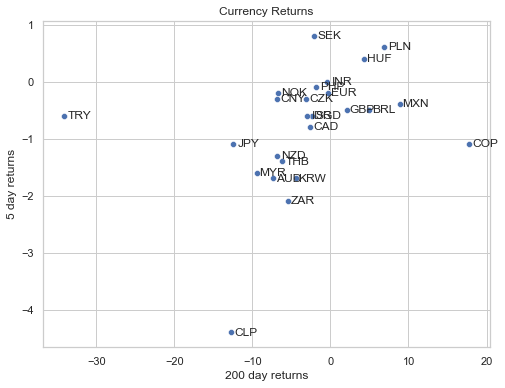

In [2]:
# Create a scatterplot using Seaborn
sns.set(style="whitegrid")  # Set the style of the plot
plt.figure(figsize=(8, 6))  # Set the figure size

xloc = 200
yloc = 5

# Create the scatterplot
sns.scatterplot(x=xloc, y=yloc, data=final_df, marker='o', color='b')

label_offset = 2
for i, (x, y) in enumerate(zip(final_df[xloc], final_df[yloc])):
    plt.text(x + label_offset, y, final_df.index[i], fontsize=12, ha='center', va='center')


# Add title and labels
plt.title("Currency Returns")
plt.xlabel(f"{xloc} day returns")
plt.ylabel(f"{yloc} day returns")

# Show the plot
plt.show()

<AxesSubplot:>

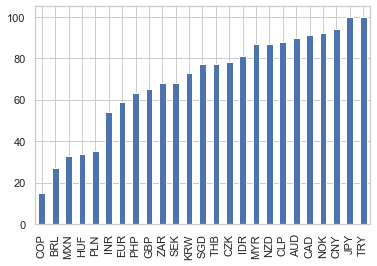

In [3]:
df_fx2 = df_fx.iloc[-250:]
df_percentiles = 100 - ((df_fx2.iloc[-1] - df_fx2.min(axis=0)) / (df_fx2.max(axis=0) - df_fx2.min(axis=0)) * 100).round(0)
df_percentiles.sort_values().plot(kind="bar")

In [4]:
def get_raw_data(name,years):
    #pull data from yfinance
    start_date = datetime.datetime.now() - datetime.timedelta(days=365*years)
    end_date = date.today()
    ticker = yf.Ticker(name)
    df = ticker.history(interval="1d",start=start_date,end=end_date)

    #clean dataframe
    try:
        df = df.drop(["Volume", "Dividends","Stock Splits"], axis=1)
    except:
        pass
    cols = df.columns[df.dtypes.eq(object)]
    df[cols] = df[cols].apply(pd.to_numeric, errors='coerce', axis=0)
    return(df)

def calc_macd(df):
    #calculate macds
    df["k"] = df["Close"].ewm(span=12, adjust=False, min_periods=12).mean()
    df["d"] = df["Close"].ewm(span=26, adjust=False, min_periods=12).mean()

    # Get the 9-Day EMA of the MACD for the Trigger line
    df["macd"] = df["k"] - df["d"]  #ema diff
    df["macd_s"] = df["macd"].ewm(span=9, adjust=False, min_periods=9).mean() #ema of ema diff
    df["macd_h"] =  df["macd"] - df["macd_s"]
    return(df)

def calc_macd_cols(series): 
    df = series.to_frame()
    df.columns = ["Close"]
    #calculate macds
    df["k"] = df.ewm(span=12, adjust=False, min_periods=12).mean()
    df["d"] = series.ewm(span=26, adjust=False, min_periods=12).mean()

    # Get the 9-Day EMA of the MACD for the Trigger line
    df["macd"] = df["k"] - df["d"]  #ema diff
    df["macd_s"] = df["macd"].ewm(span=9, adjust=False, min_periods=9).mean() #ema of ema diff
    df["macd_h"] =  df["macd"] - df["macd_s"]
    return(df["macd_h"])

def chart_macd(df):
    # Construct a 2 x 1 Plotly figure
    fig = make_subplots(rows=2, cols=1)

    # Colorize the histogram values
    colors = np.where(df['macd_h'] < 0, '#000', '#ff9900')

    fig.append_trace(
        go.Candlestick(x=df.index,
                    open=df['Open'],
                    high=df['High'],
                    low=df['Low'],
                    close=df['Close'],
                    name = "candles",
        ), row = 1, col = 1)

    fig.append_trace(
        go.Scatter(
            x=df.index,
            y=df["macd_s"],
            name = "macd_signal"
        ), row = 2, col = 1)

    fig.append_trace(
        go.Scatter(
            x=df.index,
            y=df["macd"],
            name = "macd"
        ), row = 2, col = 1)

    fig.append_trace(
        go.Bar(
            x=df.index,
            y=df['macd_h'],
            name='spread',
            marker_color = colors
        ), row=2, col=1
    )

    # Make it pretty
    layout = go.Layout(
        plot_bgcolor='#ffffff',
        # Font Families
        font_family='Monospace',
        font_color='#000000',
        font_size=12,
        width=612,
        height=692,
        autosize=False,
        title=adj_name,
        xaxis=dict(
            rangeslider=dict(
                visible=False
            )
        )
    )

    fig.update_layout(layout)

    #fig.update_yaxes(range=[5, 20])
    #fig.show()
    return fig

In [5]:
figure_list = [] 

for currencies in df_fx.columns.tolist():
    rawname = currencies
    adj_name = "USD" + rawname + "=x"
    df = get_raw_data(adj_name,1)
    df = calc_macd(df)
    fig1 = chart_macd(df)
    figure_list.append(fig1)
       
import plotly.io as pio
from reportlab.lib.pagesizes import letter
from reportlab.pdfgen import canvas
from PIL import Image

def save_plotly_figures_as_pdf(figure_list, pdf_filename):
    # Create a PDF document
    c = canvas.Canvas(pdf_filename, pagesize=letter)
    
    # Iterate through the list of Plotly figures
    for fig in figure_list:
        # Export the Plotly figure to a temporary image file (PNG)
        image_filename = "temp_image.png"
        pio.write_image(fig, image_filename)
        
        # Add the image to the PDF
        img = Image.open(image_filename)
        img_width, img_height = img.size
        c.drawImage(image_filename, 0, 0, width=img_width, height=img_height)
        
        # Add a new page for the next figure
        c.showPage()
    
    # Save and close the PDF document
    c.save()

# Example usage:
# Replace 'figure_list' with your list of Plotly figures, and 'output.pdf' with your desired PDF filename
# save_plotly_figures_as_pdf(figure_list, 'output.pdf')

# save_plotly_figures_as_pdf(figure_list, "FX_chartpack.pdf")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [6]:
import os
import plotly.io as pio
from reportlab.lib.pagesizes import letter
from reportlab.pdfgen import canvas
from PIL import Image

figure_list = []

for currencies in df_fx.columns.tolist():
    rawname = currencies
    adj_name = "USD" + rawname + "=x"
    df = get_raw_data(adj_name, 1)
    df = calc_macd(df)
    fig1 = chart_macd(df)
    figure_list.append(fig1)

def save_plotly_figures_as_pdf(figure_list, pdf_filename):
    # Create a PDF document
    c = canvas.Canvas(pdf_filename, pagesize=letter)
    
    # Iterate through the list of Plotly figures
    for index, fig in enumerate(figure_list):
        # Export the Plotly figure to a temporary image file (PNG)
        image_filename = f"temp_image_{index}.png"
        pio.write_image(fig, image_filename)
        
        # Add the image to the PDF
        img = Image.open(image_filename)
        img_width, img_height = img.size
        c.drawImage(image_filename, 0, 0, width=img_width, height=img_height)
        
        # Add a new page for the next figure
        c.showPage()
        
        # Delete the temporary image file to avoid clutter
        os.remove(image_filename)
    
    # Save and close the PDF document
    c.save()

# Example usage:
# Replace 'figure_list' with your list of Plotly figures, and 'output.pdf' with your desired PDF filename
# save_plotly_figures_as_pdf(figure_list, 'output.pdf')

save_plotly_figures_as_pdf(figure_list, f"FX_chartpack {date.today()}.pdf")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/Users/macproajb/opt/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



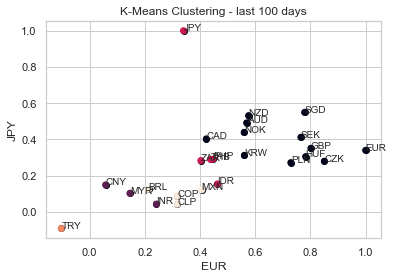

<IPython.core.display.Javascript object>

/Users/macproajb/opt/anaconda3/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



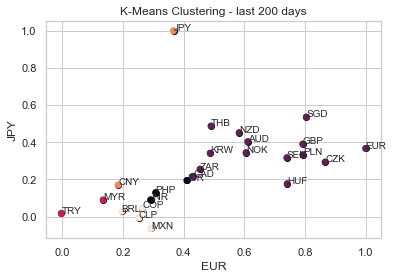

In [7]:
def create_corr_chart(days,clusters=5, ccy1="EUR", ccy2="JPY"):
    from sklearn.preprocessing import StandardScaler
    xyz = df_fx.pct_change(1).iloc[-days:].corr()
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(xyz)

    # Create a KMeans object
    kmeans = KMeans(n_clusters=clusters)

    # Fit the KMeans object to the data
    kmeans.fit(scaled_data)

    # Predict the cluster labels for each data point
    cluster_labels = kmeans.predict(scaled_data)

    # Add the cluster labels to the DataFrame
    xyz['cluster_label'] = cluster_labels

    x = xyz[ccy1]
    y = xyz[ccy2]

    # Create a scatter plot with labels
    for i in range(len(x)):
        plt.scatter(x[i], y[i], c=cluster_labels[i])
        plt.annotate(str(xyz.index.tolist()[i]), (x[i], y[i]), fontsize=10)

    # Create a scatter plot
    plt.scatter(xyz[ccy1], xyz[ccy2], c=cluster_labels)

    # Add a title and axis labels
    plt.title(f'K-Means Clustering - last {days} days')
    plt.xlabel(ccy1)
    plt.ylabel(ccy2)

    # Show the plot
    plt.show()

create_corr_chart(100)
create_corr_chart(200)

In [8]:
#show me drawdowns. max loss over next n days for selling dollars at worst possible time


df_fxi = 1 / df_fx.iloc[-600:]
drawdowns = []
ndays = 30

def calc_drawdown(ccy):
    name = f"{ccy} drawdown"
    df_fxi[name] = ((df_fxi[ccy] / df_fxi[ccy].rolling(ndays).min()) - 1) * 100

for ccy in df_fxi.columns:
    calc_drawdown(ccy)
    drawdowns.append(f"{ccy} drawdown")

chart_order = df_fxi[drawdowns].iloc[-1].sort_values(ascending=False).index.tolist()
df_drawdowns = df_fxi[chart_order]
    
create_chart_grid(df_drawdowns,5,5,0,10,f"Drawdowns: max loss over next {ndays} for selling dollars at worst possible time")

<AxesSubplot:>

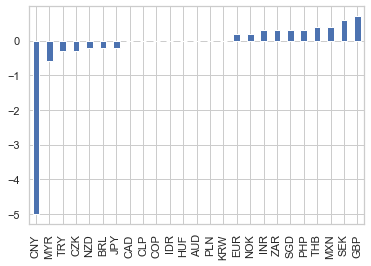

In [9]:
#vol adjusted daily moves

last_move = df_fx.pct_change().iloc[-1]
std = df_fx.pct_change().std()

std_moves = last_move / std
std_moves.sort_values().round(1).plot(kind="bar")

In [10]:
#zscores of all the crosses

df_outrights = 1 / df_fx.iloc[-200:]
df_outrights
df_outrights = df_outrights.replace(0, np.NaN)

ccy_crosses = []

for col in df_outrights.columns:
    df_temp =  (df_outrights.loc[:, df_outrights.columns != col]) / df_outrights[[col]].values

    df_zscore = (df_temp.iloc[-1] - df_temp.mean()) / df_temp.std()
    ccy_crosses.append(df_zscore)
    
crosses_list = pd.DataFrame(ccy_crosses)
crosses_list.index = df_outrights.columns
crosses_list = crosses_list.apply(pd.to_numeric, errors='coerce', axis=0)

crosses_list

print("zscore of all FX crosses")
crosses_list.style.background_gradient(cmap='RdYlGn').format('{0:.1f}')


<IPython.core.display.Javascript object>

zscore of all FX crosses


,MXN,CLP,ZAR,TRY,PLN,HUF,CZK,CNY,KRW,SGD,MYR,IDR,INR,PHP,THB,EUR,JPY,GBP,CAD,AUD,NZD,SEK,NOK,COP,BRL
BRL,0.8,1.9,0.5,1.3,-0.2,0.7,1.5,0.9,0.6,0.8,1.0,1.6,0.9,0.5,1.2,1.1,1.5,1.7,1.7,1.3,1.4,0.7,1.5,-1.1,nan
MXN,nan,1.6,0.2,1.2,-0.7,0.1,1.0,0.6,0.2,0.3,0.6,1.0,0.3,0.1,0.8,0.4,1.2,0.8,0.9,0.8,0.9,0.3,1.1,-1.4,-0.8
CLP,-1.5,nan,-1.8,0.8,-1.8,-2.2,-1.8,-1.8,-2.1,-1.9,-1.8,-1.7,-1.8,-2.1,-1.9,-1.8,-0.8,-1.6,-1.6,-1.9,-1.7,-2.1,-1.2,-1.5,-1.8
ZAR,-0.2,2.0,nan,1.3,-0.6,-0.1,1.1,0.8,-0.1,0.2,1.0,0.9,0.1,-0.2,1.0,0.1,1.9,0.2,0.6,1.4,1.4,0.4,1.7,-0.9,-0.5
TRY,-1.1,-0.8,-1.2,nan,-1.2,-1.2,-1.1,-1.2,-1.2,-1.2,-1.2,-1.1,-1.2,-1.2,-1.1,-1.1,-1.0,-1.1,-1.1,-1.1,-1.1,-1.2,-1.0,-1.1,-1.1
PLN,0.7,2.0,0.6,1.3,nan,0.8,1.7,1.0,0.6,0.9,1.0,1.5,0.8,0.6,1.3,1.2,1.6,1.9,1.5,1.3,1.4,0.8,1.5,-1.0,0.2
HUF,-0.2,2.4,0.1,1.4,-0.8,nan,2.2,0.7,0.0,0.3,0.8,1.7,0.2,-0.0,1.2,0.4,1.7,0.5,0.9,1.2,1.4,0.5,1.1,-1.0,-0.7
CZK,-1.0,1.9,-1.1,1.2,-1.6,-2.1,nan,-0.4,-1.3,-1.4,-0.3,-0.4,-1.2,-1.6,-0.4,-1.6,1.2,-1.0,-0.6,-0.1,0.0,-1.2,0.2,-1.3,-1.5
CNY,-0.6,1.8,-0.8,1.3,-0.9,-0.7,0.4,nan,-0.9,-1.0,0.3,0.2,-0.9,-1.4,0.2,-0.6,2.1,-0.4,-0.2,0.4,0.6,-0.7,0.5,-1.0,-0.9
KRW,-0.2,2.2,0.1,1.3,-0.6,-0.1,1.4,0.9,nan,0.4,1.1,1.3,0.3,-0.1,1.4,0.3,1.9,0.4,1.3,2.0,1.8,0.5,1.7,-1.0,-0.6


In [11]:
#calculate sizing based on realized vols

#theres some issue here with vol calcs, might need to double the numbers

lookback = 200 # days
df_annual_vol = df_fx.iloc[-lookback:].pct_change().std() * np.sqrt(252) * 100
df_daily_vol = df_annual_vol / np.sqrt(252)
#df_annual_vol.round(1).sort_values(ascending=False)

total_capital = 100000000 # $
max_risk = 20 # bps
max_risk_dollars = total_capital * max_risk / 10000

sizing = max_risk_dollars / (df_daily_vol/100) / 1000000 / 2 #two standard deviation event loses only max_risk_dollars
sizing_dollars = sizing.round(1).sort_values() #in millions

risk_df = pd.DataFrame([df_daily_vol,df_annual_vol,sizing_dollars]).T.round(1)
risk_df.columns = ["daily vol","annual vol","dollar sizing (mn)"]

# def highlight_rows(df, index_list, color='yellow'):
#   styler = df.style.apply(lambda x: ['background-color: {}'.format(color) if x.name in index_list else '' for x in x], axis=1)
#   return styler

# index_list = ["BRL","COP","MXN","CLP"]
# # Highlight the rows in the DataFrame.
# highlighted_df = highlight_rows(df, index_list)

print(F"For a portfolio of {total_capital/1e6}mn and risking max {max_risk}bps on a 2z move")
risk_df.sort_values(by="dollar sizing (mn)",ascending=False)



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

For a portfolio of 100.0mn and risking max 20bps on a 2z move


,daily vol,annual vol,dollar sizing (mn)
SGD,0.3,4.3,36.6
INR,0.3,4.8,33.3
CAD,0.4,5.6,28.5
MYR,0.4,5.9,27.0
IDR,0.4,6.5,24.5
PHP,0.4,6.7,23.6
EUR,0.4,7.0,22.5
GBP,0.5,7.7,20.7
THB,0.5,7.9,20.0
JPY,0.6,8.8,18.1


In [12]:
from pandas_datareader import data

# Set the start and end dates.
start_date = '2003-01-01'
end_date = '2023-09-23'

# Get the three-month treasury bill data from FRED.
t_bill_data = data.DataReader('DTB3', 'fred', start_date, end_date) / 100


# #get historical Sharpes
n_days = 200
df_fx2 = full_df(10,exceptions=1)
df_fx2 = delete_outliers(df_fx2,3)
df_returns = df_fx2.pct_change(n_days)
df_returns = df_returns.merge(t_bill_data, left_index=True, right_index=True, how='inner')
df_returns
df_vol = df_fx2.pct_change(1).std() * np.sqrt(252)
df_sharpe = (df_returns.sub(df_returns["DTB3"], axis=0))/ df_vol
df_sharpe = df_sharpe.iloc[n_days:]
df_excluded = df_sharpe.drop(columns=["DTB3"])
sort_list = df_excluded.iloc[-1].sort_values(ascending=False).index.tolist()
create_chart_grid(df_excluded[sort_list],5,5,-2,2,"Sharpe Ratios")

#see if sharpe relative to other currencies, predicts future returns



[*********************100%***********************]  25 of 25 completed


<IPython.core.display.Javascript object>

In [13]:
px.line(df_excluded.abs().gt(1).sum(axis=1) / 25)

In [14]:
yields = ["DGS2","DGS5","DGS10","DFII5","DFII10"]
names = ["2y Treasury","5y Treasury","10y Treasury","5y TIPS","10y TIPS"]

end_date = datetime.date.today()
start_date = end_date - datetime.timedelta(days=3650)

df = data.DataReader(yields, 'fred', start_date, end_date)
df.columns = names
df.head()

#add some checks, make sure the longer maturity is second. make sure the rates are in % and not rounr numbers
def calc_forward(rate1,rate2,maturity1, maturity2):
    ratelist = [rate1,rate2]
    if rate1 == rate2:
        rate2 = rate2 + .01
    ratelist = [x/100 if x > 1 else x for x in ratelist]
    maturitylist = [maturity1,maturity2]
    maturitylist = sorted(maturitylist)
    year_gap = maturitylist[1] - maturitylist[0]
    discount0 = 1 / (1 + ratelist[0])**maturitylist[0]
    discount1 = 1 / (1 + ratelist[1])**maturitylist[1]
    forward_rate = round(((discount0/discount1) ** (1/year_gap) - 1) * 100,2)
    #print(f"The forward rate for the {maturitylist[0]}y{year_gap}y is {forward_rate}%")
    if rate1 < 0 or rate2 < 0:
        forward_rate = 0 
    return(forward_rate)

calc_forward(5,.06,10,5)        


7.01

In [15]:
calc_forward(5.02,4.40,2,5)
calc_forward(5.0234,4.5036,2,4)
calc_forward(4.40,4.2490,5,10)
calc_forward(5.4606,5.0234,1,2)

#something here gives some very werid results
df = df.interpolate(method='linear', limit=1, fill_value='ffill')
df['5y5y'] = df.apply(lambda df: calc_forward(df['5y Treasury'], df['10y Treasury'],5,10),axis=1)
df['5y5y TIPS'] = df.apply(lambda df: calc_forward(df['5y TIPS'], df['10y TIPS'],5,10),axis=1)
df["5s10s"] = df["10y Treasury"] - df["5y Treasury"]
df["2s10s"] = df["10y Treasury"] - df["2y Treasury"]
df_rates = df.copy()

<ipython-input-14-e86f415aabcd>:20: RuntimeWarning:

divide by zero encountered in scalar divide

<ipython-input-14-e86f415aabcd>:22: RuntimeWarning:

invalid value encountered in scalar power

<ipython-input-14-e86f415aabcd>:21: RuntimeWarning:

divide by zero encountered in scalar divide



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

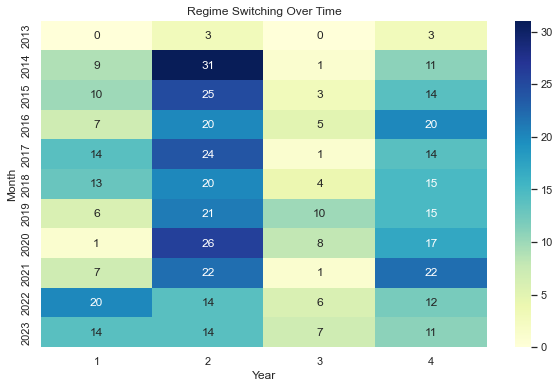

In [16]:
#take rates moves and categorize them in regimes

df_weekly = df.resample("W").mean()
df_weekly
df_weekly_change = round(df_weekly.diff(1) * 100,0)
# 1	bear flatter
# 2	bull flatter
# 3	bull steeper
# 4	bear steeper
df_weekly_change["regime"] = np.where(df_weekly_change["2s10s"] > 0, \
                                      np.where(df_weekly_change["2y Treasury"].abs() > df_weekly_change["10y Treasury"].abs(),3, 4), \
                                      np.where(df_weekly_change["2y Treasury"].abs() > df_weekly_change["10y Treasury"].abs(),1,2))

df_weekly_change["regime_change"] = df_weekly_change['regime'].astype(str) + '.' + df_weekly_change['regime'].shift(-1).astype(str)
df_weekly_change = df_weekly_change[:-1]
type(df_weekly_change)
pivot_df = df_weekly_change.pivot_table(index=df_weekly_change.index.year, \
                                                  columns=df_weekly_change["regime"], \
                                                  aggfunc='size', fill_value=0)
plt.figure(figsize=(10, 6))
sns.heatmap(pivot_df, cmap='YlGnBu', annot=True, fmt='d', cbar=True)
plt.title('Regime Switching Over Time')
plt.xlabel('Year')
plt.ylabel('Month')
plt.show()

# df_weekly_change["regime_change"].iloc[-200:].value_counts()

In [17]:
# Create a pivot table to count occurrences of each regime for each date
pivot_df = df_weekly_change.pivot_table(index=df_weekly_change.index, columns='regime', aggfunc='size', fill_value=0)
result_df = pivot_df.apply(lambda x: x.idxmax() if x.max() == 1 else 0, axis=1).to_frame()
result_df.columns = ['Value']
#result_df["Value"] = result_df["Value"].apply(pd.to_numeric,errors="coerce")

# # Define colors based on the 'Value' column
# unique_values = result_df['Value'].unique()
# cmap = ListedColormap(plt.cm.get_cmap('viridis', len(unique_values))(np.arange(len(unique_values))))

# # Define colors based on the 'Value' column
# unique_values = result_df['Value'].unique()
# normalize = Normalize(vmin=unique_values.min(), vmax=unique_values.max())
# colormap = plt.cm.get_cmap('viridis', len(unique_values))

# # Set a fixed height for all bars
# bar_height = 1

# # Create a bar chart
# plt.figure(figsize=(10, 6))
# bars = plt.bar(result_df.index, [bar_height] * len(result_df), color=colormap(normalize(result_df['Value'])))

# plt.xlabel('Value')
# plt.ylabel('Date')
# plt.title('Bar Chart with Different Colors for Each Value')
# plt.xticks([])
# plt.yticks(rotation=45)
# plt.tight_layout()

# # Add color legend
# legend_handles = [plt.Rectangle((0, 0), 1, 1, color=colormap(normalize(i))) for i in unique_values]
# plt.legend(legend_handles, unique_values, title='Value', loc='upper right')

# plt.show()



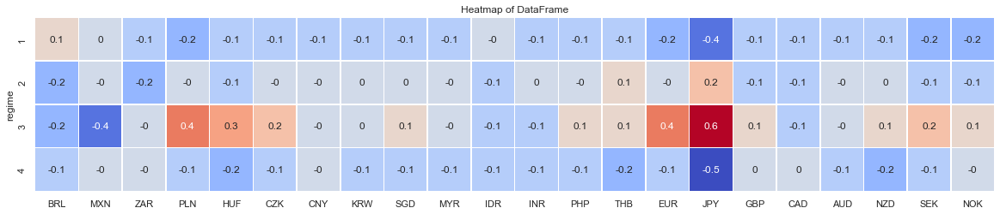

In [18]:
#compute perf of each currency in each of the regimes
#gotta check timeframe of all these different dataframes

df_fx_weekly = df_fx.resample('W').mean().pct_change()

merged_df = df_fx_weekly.merge(df_weekly_change["regime"], left_index=True, right_index=True, how='inner')
perf_in_regimes = round(merged_df.groupby("regime").mean() * 100,1)
columns_to_exclude = ['COP', 'CLP','TRY']
perf_in_regimes = perf_in_regimes.drop(columns=columns_to_exclude)

# Create a heatmap
plt.figure(figsize=(20, 12))
sns.heatmap(perf_in_regimes, cmap='coolwarm', annot=True, fmt='g', linewidths=0.5, square=True, cbar=False)

plt.title('Heatmap of DataFrame')
plt.show()

<AxesSubplot:title={'center':'similarity index'}>

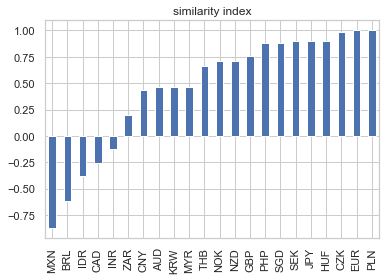

In [19]:
#create clusters of currencies, plot the cosine similarity index, and then plot the similarity index to EUR
#next step would be to see how clusters are changing over time

from sklearn.metrics.pairwise import cosine_similarity

#Calculate the cosine similarity between all pairs of stocks
type(perf_in_regimes.T.astype(float))
similarity_matrix = cosine_similarity(perf_in_regimes.T)

# Convert the similarity matrix to a DataFrame for better readability
similarity_df = pd.DataFrame(similarity_matrix, columns=perf_in_regimes.columns, index=perf_in_regimes.columns)

similarity_df["EUR"].sort_values().plot(kind="bar", title="similarity index")

In [20]:
#see correl of currencies to stocks and bonds

# Set the start and end dates.
years = 1
start_date = datetime.datetime.now() - datetime.timedelta(days=365*years)
end_date = date.today()

# Get the three-month treasury bill data from FRED.
fred_list = ['SP500','DGS10']
stocks_bonds = data.DataReader(fred_list, 'fred', start_date, end_date)
stocks_bonds_weekly = stocks_bonds.resample('W').mean()
df_fx_weekly = full_df(years,exceptions=0).resample('W').mean()
joined_df = df_fx_weekly.merge(stocks_bonds_weekly, left_index=True, right_index=True, how="inner")
df_for_scatter = joined_df.pct_change(1).iloc[1:].corr()[fred_list]
create_scatter(df_for_scatter.iloc[:-1],fred_list[0],fred_list[1],df_for_scatter.index.tolist(),f"Correlations over last {years} year")

[*********************100%***********************]  25 of 25 completed
